In [1]:
import sys
sys.path.append("..")
from MPRA_predict.utils import *
from MPRA_predict.datasets import *
from MPRA_predict.metrics import *

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.width', 1000)
pd.set_option('display.precision', 3)
np.set_printoptions(linewidth=1000)

In [2]:
MPRA_df = pd.read_csv('../data/SirajMPRA/SirajMPRA_562654.csv')
MPRA_df

,description,seq,A549,HepG2,K562,SK-N-SH,HCT116,is_ref,chr,pos,ref,alt,start,end,585605_index
0,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,0.668,-0.704,0.539,0.159,True,chr1,14677,G,A,14577,14777,0
1,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,0.416,0.554,0.442,-0.288,False,chr1,14677,G,A,14577,14777,1
2,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,1.270,-0.391,0.752,1.100,True,chr1,63697,T,C,63597,63797,2
3,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,1.152,-0.659,0.205,1.051,False,chr1,63697,T,C,63597,63797,3
4,chr1:64764:C:T,AATAGACTCTAGTACTCTGTATTATGCAAAATTTGTCTATGTTACA...,NaN,-0.211,-0.007,0.499,0.258,True,chr1,64764,C,T,64664,64864,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562649,chrX:155233098:T:C,ATCATTTACTGGTGACTGCCCTGCTAGGGTGTCAGCTGTCAGATCC...,NaN,0.616,1.927,0.798,1.035,False,chrX,155233098,T,C,155232998,155233198,585600
562650,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,1.410,0.556,2.843,1.496,True,chrX,155233794,A,G,155233694,155233894,585601
562651,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,0.895,-0.073,1.974,0.795,False,chrX,155233794,A,G,155233694,155233894,585602
562652,chrX:155234730:T:C,TGGTGAGTTGCTTCTGTGCACACACTTTTGTTTATGAGTGTGCATG...,NaN,0.312,0.166,-0.041,0.444,True,chrX,155234730,T,C,155234630,155234830,585603


In [3]:
MPRA_df_stack = pd.read_csv('../data/SirajMPRA/SirajMPRA_562654_stack.csv')
MPRA_df_stack

,description,seq,A549,HepG2,K562,SK-N-SH,HCT116,is_ref,chr,pos,ref,alt,start,end,585605_index,HepG2_DNase,HepG2_H3K4me1,HepG2_H3K4me3,HepG2_H3K9me3,HepG2_H3K27me3,HepG2_H3K27ac,HepG2_H3K36me3,HepG2_CTCF,K562_DNase,K562_H3K4me1,K562_H3K4me3,K562_H3K9me3,K562_H3K27me3,K562_H3K27ac,K562_H3K36me3,K562_CTCF,SK-N-SH_DNase,SK-N-SH_H3K4me1,SK-N-SH_H3K4me3,SK-N-SH_H3K9me3,SK-N-SH_H3K27me3,SK-N-SH_H3K27ac,SK-N-SH_H3K36me3,SK-N-SH_CTCF,A549_DNase,A549_H3K4me1,A549_H3K4me3,A549_H3K9me3,A549_H3K27me3,A549_H3K27ac,A549_H3K36me3,A549_CTCF,HCT116_DNase,HCT116_H3K4me1,HCT116_H3K4me3,HCT116_H3K9me3,HCT116_H3K27me3,HCT116_H3K27ac,HCT116_H3K36me3,HCT116_CTCF
0,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,0.256,-1.092,0.156,-0.223,True,chr1,14677,G,A,14577,14777,0,1.313,1.209,1.923,0.779,2.484,1.661,2.092,1.207,1.434,1.857,2.131,2.178,2.211,1.846,1.891,1.453,1.430,NaN,2.076,NaN,2.219,1.373,1.631,1.184,1.121,1.384,2.139,2.259,2.374,1.727,1.780,1.287,0.921,1.231,2.038,0.887,1.550,1.624,1.946,1.171
1,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,-0.003,0.068,0.066,-0.719,False,chr1,14677,G,A,14577,14777,1,1.294,1.236,1.913,0.762,2.495,1.664,2.110,1.235,1.412,1.844,2.114,2.147,2.189,1.854,1.864,1.473,1.373,NaN,2.010,NaN,2.215,1.342,1.631,1.187,1.108,1.362,2.092,2.203,2.313,1.698,1.719,1.309,0.913,1.179,2.004,0.789,1.485,1.597,1.908,1.197
2,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,0.877,-0.803,0.354,0.821,True,chr1,63697,T,C,63597,63797,2,1.026,1.371,1.174,0.130,0.524,0.922,0.086,0.409,0.319,0.198,0.462,-0.438,0.668,0.157,0.617,0.078,-0.110,NaN,1.122,NaN,-0.050,1.787,0.537,0.378,1.392,1.241,1.204,0.145,0.882,0.838,0.937,0.314,0.911,1.095,0.640,-0.177,1.205,0.795,0.211,0.206
3,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,0.756,-1.050,-0.154,0.766,False,chr1,63697,T,C,63597,63797,3,1.022,1.274,0.990,0.335,0.480,0.783,0.053,0.411,0.224,0.079,0.305,-0.415,0.611,0.004,0.595,0.037,-0.260,NaN,0.820,NaN,-0.022,1.525,0.580,0.285,1.384,1.097,0.969,0.173,0.751,0.632,0.989,0.298,0.925,1.043,0.513,-0.162,0.894,0.676,0.277,0.188
4,chr1:64764:C:T,AATAGACTCTAGTACTCTGTATTATGCAAAATTTGTCTATGTTACA...,NaN,-0.649,-0.449,0.119,-0.114,True,chr1,64764,C,T,64664,64864,4,-0.988,-0.600,-0.719,0.185,-0.474,-0.858,-0.848,-0.901,-0.765,-0.785,-0.781,-1.259,-0.531,-0.662,-0.968,-0.709,-0.835,NaN,-0.579,NaN,-0.892,-0.424,-1.130,-0.776,-1.083,-0.762,-0.813,-0.991,0.105,-0.803,-0.624,-0.821,-0.935,-0.916,-0.818,0.435,0.415,-0.736,-1.276,-0.686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562649,chrX:155233098:T:C,ATCATTTACTGGTGACTGCCCTGCTAGGGTGTCAGCTGTCAGATCC...,NaN,0.203,1.334,0.397,0.749,False,chrX,155233098,T,C,155232998,155233198,585600,2.066,2.489,2.190,0.419,1.252,2.592,1.194,1.500,1.432,1.627,1.429,1.534,1.026,1.501,1.212,1.084,1.033,NaN,0.972,NaN,1.426,0.688,1.553,0.994,1.518,2.130,2.014,0.877,0.901,2.117,0.660,1.190,1.159,1.561,1.521,-1.286,0.266,1.322,1.346,0.979
562650,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,1.021,0.070,2.294,1.259,True,chrX,155233794,A,G,155233694,155233894,585601,0.844,0.886,1.232,0.873,0.177,0.820,1.057,0.878,0.668,0.424,0.696,0.436,0.450,0.611,1.729,0.373,1.408,NaN,1.844,NaN,0.849,2.360,1.388,1.255,1.744,1.724,1.473,0.836,0.536,1.525,1.424,0.911,1.858,1.976,1.727,-0.630,1.291,1.653,1.009,0.885
562651,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,0.490,-0.510,1.487,0.482,False,chrX,155233794,A,G,155233694,155233894,585602,0.810,1.034,1.391,0.815,0.714,0.957,1.205,0.843,0.601,0.528,0.870,0.488,0.796,0.746,1.662,0.405,1.332,NaN,1.759,NaN,1.025,1.878,1.365,1.126,1.374,1.373,1.496,0.829,1.060,1.356,1.477,0.833,1.471,1.646,1.782,-0.341,1.285,1.487,1.148,0.733
562652,chrX:155234730:T:C,TGGTGAGTTGCTTCTGTGCACACACTTTTGTTTATGAGTGTGCAT

In [4]:
MPRA_df_concat = pd.read_csv('../data/SirajMPRA/SirajMPRA_562654_concat.csv')
MPRA_df_concat

,description,seq,chr,is_ref,pos,ref,alt,start,end,cell_type,exp,DNase,H3K4me1,H3K4me3,H3K9me3,H3K27me3,H3K27ac,H3K36me3,CTCF
0,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,chr1,True,14677,G,A,14577,14777,HepG2,0.256,1.313,1.209,1.923,0.779,2.484,1.661,2.092,1.207
1,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,chr1,False,14677,G,A,14577,14777,HepG2,-0.003,1.294,1.236,1.913,0.762,2.495,1.664,2.110,1.235
2,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,chr1,True,63697,T,C,63597,63797,HepG2,0.877,1.026,1.371,1.174,0.130,0.524,0.922,0.086,0.409
3,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,chr1,False,63697,T,C,63597,63797,HepG2,0.756,1.022,1.274,0.990,0.335,0.480,0.783,0.053,0.411
4,chr1:64764:C:T,AATAGACTCTAGTACTCTGTATTATGCAAAATTTGTCTATGTTACA...,chr1,True,64764,C,T,64664,64864,HepG2,-0.649,-0.988,-0.600,-0.719,0.185,-0.474,-0.858,-0.848,-0.901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2813265,chrX:155233098:T:C,ATCATTTACTGGTGACTGCCCTGCTAGGGTGTCAGCTGTCAGATCC...,chrX,False,155233098,T,C,155232998,155233198,HCT116,0.749,1.159,1.561,1.521,-1.286,0.266,1.322,1.346,0.979
2813266,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,chrX,True,155233794,A,G,155233694,155233894,HCT116,1.259,1.858,1.976,1.727,-0.630,1.291,1.653,1.009,0.885
2813267,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,chrX,False,155233794,A,G,155233694,155233894,HCT116,0.482,1.471,1.646,1.782,-0.341,1.285,1.487,1.148,0.733
2813268,chrX:155234730:T:C,TGGTGAGTTGCTTCTGTGCACACACTTTTGTTTATGAGTGTGCATG...,chrX,True,155234730,T,C,155234630,155234830,HCT116,0.093,0.360,0.418,-0.143,1.142,1.582,-0.273,1.425,-0.161


In [5]:
cell_types = ['HepG2', 'K562', 'SK-N-SH', 'A549', 'HCT116']
assays = ['DNase', 'H3K4me1', 'H3K4me3', 'H3K9me3', 'H3K27me3', 'H3K27ac', 'H3K36me3', 'CTCF']

In [6]:
# overall cell types pearson

for i, assay in enumerate(assays):
    x, y = np.array(MPRA_df_concat['exp']), np.array(MPRA_df_concat[assay])
    r, p = pearson(x, y)
    print(f'{assay}: {r}')

DNase: 0.4258309650086831
H3K4me1: 0.37451659017845657
H3K4me3: 0.44819399828677403
H3K9me3: 0.10955010216267998
H3K27me3: 0.20053393469990557
H3K27ac: 0.43911840746433867
H3K36me3: 0.2776508001677373
CTCF: 0.33180689784185774


In [7]:
data_split_dict = {}
data_split_dict['total'] = np.ones(len(MPRA_df), dtype=bool)
data_split_dict['chrom'] = MPRA_df['chr'].isin([f'chr{i}' for i in range(1, 23)])
data_split_dict['train'] = MPRA_df['chr'].isin([f'chr{i}' for i in range(3, 23)])
data_split_dict['valid'] = MPRA_df['chr'].isin(['chr1'])
data_split_dict['test'] = MPRA_df['chr'].isin(['chr2'])
data_split_dict['designed'] = MPRA_df['chr'].isin(['chr0'])


stds = MPRA_df[cell_types].std(axis=1, skipna=True)
threshold = np.percentile(stds.dropna(), 90)
data_split_dict['diff'] = (stds > threshold)
data_split_dict['const'] = ~data_split_dict['diff']

# MPRA_df['diff'] = (MPRA_df[cell_types].max(axis=1) - MPRA_df[cell_types].min(axis=1)) > 1
# data_split_dict['const'] = ~MPRA_df['diff']
# data_split_dict['diff']  = MPRA_df['diff']
print(len(MPRA_df), data_split_dict['const'].sum(), data_split_dict['diff'].sum())


keys = list(data_split_dict.keys())
for k1 in keys:
    for k2 in keys:
        data_split_dict[f'{k1}_{k2}'] = data_split_dict[k1] & data_split_dict[k2]

562654 506509 56145


In [10]:
MPRA_df_stack

,description,seq,A549,HepG2,K562,SK-N-SH,HCT116,is_ref,chr,pos,ref,alt,start,end,585605_index,HepG2_DNase,HepG2_H3K4me1,HepG2_H3K4me3,HepG2_H3K9me3,HepG2_H3K27me3,HepG2_H3K27ac,HepG2_H3K36me3,HepG2_CTCF,K562_DNase,K562_H3K4me1,K562_H3K4me3,K562_H3K9me3,K562_H3K27me3,K562_H3K27ac,K562_H3K36me3,K562_CTCF,SK-N-SH_DNase,SK-N-SH_H3K4me1,SK-N-SH_H3K4me3,SK-N-SH_H3K9me3,SK-N-SH_H3K27me3,SK-N-SH_H3K27ac,SK-N-SH_H3K36me3,SK-N-SH_CTCF,A549_DNase,A549_H3K4me1,A549_H3K4me3,A549_H3K9me3,A549_H3K27me3,A549_H3K27ac,A549_H3K36me3,A549_CTCF,HCT116_DNase,HCT116_H3K4me1,HCT116_H3K4me3,HCT116_H3K9me3,HCT116_H3K27me3,HCT116_H3K27ac,HCT116_H3K36me3,HCT116_CTCF
0,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,0.256,-1.092,0.156,-0.223,True,chr1,14677,G,A,14577,14777,0,1.313,1.209,1.923,0.779,2.484,1.661,2.092,1.207,1.434,1.857,2.131,2.178,2.211,1.846,1.891,1.453,1.430,NaN,2.076,NaN,2.219,1.373,1.631,1.184,1.121,1.384,2.139,2.259,2.374,1.727,1.780,1.287,0.921,1.231,2.038,0.887,1.550,1.624,1.946,1.171
1,chr1:14677:G:A,AGTGCTGGTTCCGTCACCCCCTCCCAAGGAAGTAGGTCTGAGCAGC...,NaN,-0.003,0.068,0.066,-0.719,False,chr1,14677,G,A,14577,14777,1,1.294,1.236,1.913,0.762,2.495,1.664,2.110,1.235,1.412,1.844,2.114,2.147,2.189,1.854,1.864,1.473,1.373,NaN,2.010,NaN,2.215,1.342,1.631,1.187,1.108,1.362,2.092,2.203,2.313,1.698,1.719,1.309,0.913,1.179,2.004,0.789,1.485,1.597,1.908,1.197
2,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,0.877,-0.803,0.354,0.821,True,chr1,63697,T,C,63597,63797,2,1.026,1.371,1.174,0.130,0.524,0.922,0.086,0.409,0.319,0.198,0.462,-0.438,0.668,0.157,0.617,0.078,-0.110,NaN,1.122,NaN,-0.050,1.787,0.537,0.378,1.392,1.241,1.204,0.145,0.882,0.838,0.937,0.314,0.911,1.095,0.640,-0.177,1.205,0.795,0.211,0.206
3,chr1:63697:T:C,CATACATTTTTATTCTGGTCACTGTCCAACGACATTCCTCAAATGA...,NaN,0.756,-1.050,-0.154,0.766,False,chr1,63697,T,C,63597,63797,3,1.022,1.274,0.990,0.335,0.480,0.783,0.053,0.411,0.224,0.079,0.305,-0.415,0.611,0.004,0.595,0.037,-0.260,NaN,0.820,NaN,-0.022,1.525,0.580,0.285,1.384,1.097,0.969,0.173,0.751,0.632,0.989,0.298,0.925,1.043,0.513,-0.162,0.894,0.676,0.277,0.188
4,chr1:64764:C:T,AATAGACTCTAGTACTCTGTATTATGCAAAATTTGTCTATGTTACA...,NaN,-0.649,-0.449,0.119,-0.114,True,chr1,64764,C,T,64664,64864,4,-0.988,-0.600,-0.719,0.185,-0.474,-0.858,-0.848,-0.901,-0.765,-0.785,-0.781,-1.259,-0.531,-0.662,-0.968,-0.709,-0.835,NaN,-0.579,NaN,-0.892,-0.424,-1.130,-0.776,-1.083,-0.762,-0.813,-0.991,0.105,-0.803,-0.624,-0.821,-0.935,-0.916,-0.818,0.435,0.415,-0.736,-1.276,-0.686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
562649,chrX:155233098:T:C,ATCATTTACTGGTGACTGCCCTGCTAGGGTGTCAGCTGTCAGATCC...,NaN,0.203,1.334,0.397,0.749,False,chrX,155233098,T,C,155232998,155233198,585600,2.066,2.489,2.190,0.419,1.252,2.592,1.194,1.500,1.432,1.627,1.429,1.534,1.026,1.501,1.212,1.084,1.033,NaN,0.972,NaN,1.426,0.688,1.553,0.994,1.518,2.130,2.014,0.877,0.901,2.117,0.660,1.190,1.159,1.561,1.521,-1.286,0.266,1.322,1.346,0.979
562650,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,1.021,0.070,2.294,1.259,True,chrX,155233794,A,G,155233694,155233894,585601,0.844,0.886,1.232,0.873,0.177,0.820,1.057,0.878,0.668,0.424,0.696,0.436,0.450,0.611,1.729,0.373,1.408,NaN,1.844,NaN,0.849,2.360,1.388,1.255,1.744,1.724,1.473,0.836,0.536,1.525,1.424,0.911,1.858,1.976,1.727,-0.630,1.291,1.653,1.009,0.885
562651,chrX:155233794:A:G,TGGTTACTGCAGGGGCAGGGTTTTGGCAGGAAATAAACATGCACGG...,NaN,0.490,-0.510,1.487,0.482,False,chrX,155233794,A,G,155233694,155233894,585602,0.810,1.034,1.391,0.815,0.714,0.957,1.205,0.843,0.601,0.528,0.870,0.488,0.796,0.746,1.662,0.405,1.332,NaN,1.759,NaN,1.025,1.878,1.365,1.126,1.374,1.373,1.496,0.829,1.060,1.356,1.477,0.833,1.471,1.646,1.782,-0.341,1.285,1.487,1.148,0.733
562652,chrX:155234730:T:C,TGGTGAGTTGCTTCTGTGCACACACTTTTGTTTATGAGTGTGCAT

In [13]:
cell_types = ['HepG2', 'K562', 'SK-N-SH', 'A549', 'HCT116']
assays = ['DNase', 'H3K4me3', 'H3K27ac', 'CTCF']

for assay in assays:
    for data_split in ['total', 'const', 'diff',]:
        cell_types_assay = [f'{cell_type}_{assay}' for cell_type in cell_types]
        r_array = pd.DataFrame(index=cell_types, columns=cell_types_assay)
        for cell_type in cell_types:
            for cell_type_assay in cell_types_assay:
                condition = data_split_dict[data_split]
                df = MPRA_df_stack[condition]
                x, y = np.array(df[f'{cell_type}']), np.array(df[f'{cell_type_assay}'])
                r, p = pearson(x, y)
                r_array.loc[cell_type, cell_type_assay] = r
        print(data_split)
        print(r_array)
        print()

total
        HepG2_DNase K562_DNase SK-N-SH_DNase A549_DNase HCT116_DNase
HepG2         0.443      0.483         0.398      0.435        0.446
K562          0.353      0.499         0.357      0.382        0.405
SK-N-SH       0.336      0.425         0.368      0.370        0.381
A549          0.297      0.364         0.273      0.348        0.370
HCT116        0.368      0.427         0.364      0.389        0.426

const
        HepG2_DNase K562_DNase SK-N-SH_DNase A549_DNase HCT116_DNase
HepG2         0.345      0.388         0.310      0.327        0.343
K562          0.273      0.388         0.267      0.294        0.315
SK-N-SH       0.262      0.340         0.290      0.276        0.284
A549          0.196      0.258         0.181      0.244        0.264
HCT116        0.267      0.312         0.261      0.271        0.304

diff
        HepG2_DNase K562_DNase SK-N-SH_DNase A549_DNase HCT116_DNase
HepG2         0.502      0.471         0.448      0.486        0.467
K562          0

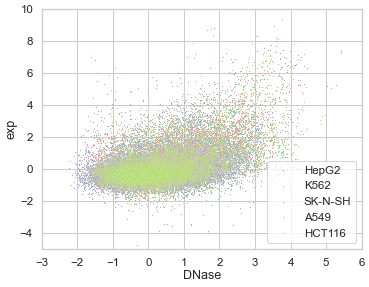

In [6]:
plt.figure(figsize=(8, 6), dpi=50)
plt.subplots_adjust(left=0.13, bottom=0.15, right=0.93, top=0.95)
handles = []
for i, cell_type in enumerate(cell_types):
    x = MPRA_df_stack[f'{cell_type}_DNase'][:10000]
    y = MPRA_df_stack[f'{cell_type}'][:10000]
    sns.scatterplot(x=x, y=y, s=3, color=color_list[i], label=cell_type)
    handles.append(mpatches.Patch(color=color_list[i], label=cell_type))
plt.xlim(-3, 6)
plt.ylim(-5, 10)
plt.xlabel('DNase')
plt.ylabel('exp')
plt.legend(loc="lower right")
plt.savefig('figures/DNase_exp', dpi=400)
plt.show()

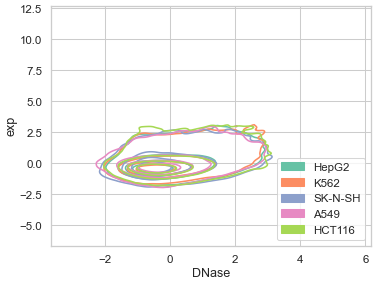

In [5]:
plt.figure(figsize=(8, 6), dpi=50)
plt.subplots_adjust(left=0.13, bottom=0.15, right=0.93, top=0.95)
handles = []
for i, cell_type in enumerate(cell_types):
    x = MPRA_df_stack[f'{cell_type}_DNase'][:100000]
    y = MPRA_df_stack[f'{cell_type}'][:100000]
    sns.kdeplot(x=x, y=y, color=color_list[i], label=cell_type, levels=5)
    handles.append(mpatches.Patch(color=color_list[i], label=cell_type))
plt.xlabel('DNase')
plt.ylabel('exp')
plt.legend(handles=handles, loc="lower right") 
plt.savefig('figures/kde_dnase_exp.png', dpi=400)
plt.show()

In [6]:
# 每条序列在不同细胞类型之间的相关系数，5v5的pearson

x = np.array(MPRA_df_stack[cell_types])
y = np.array(MPRA_df_stack[[f'{cell_type}_DNase' for cell_type in cell_types]])
print(x.shape, y.shape)

pearson_r_list = []
for i in tqdm(range(len(x))):
    x_i, y_i = remove_nan(x[i], y[i])
    if len(x_i) >= 2:
        r, p = pearsonr(x_i, y_i)
    else:
        r = np.nan
    pearson_r_list.append(r)
print(pearson_r_list)

(562654, 5) (562654, 5)


  0%|          | 0/562654 [00:00<?, ?it/s]

100%|██████████| 562654/562654 [01:47<00:00, 5218.13it/s]


[-0.1361681959966595, 0.990739465718163, 0.5502529192231151, 0.7177312058803555, 0.28702129077938915, 0.42319553968138707, -0.8100764843702493, -0.06716527319227554, 0.6029958499518919, 0.3868800870570793, 0.720290863319857, 0.677579637171654, 0.9366730488221732, 0.6748313334440517, -0.6135040288314044, -0.2690808171343419, 0.07746126874005563, 0.9288039205739259, 0.8221383785162674, -0.7171037229943835, 0.8035871336387462, 0.7524117713488012, 0.20049591995842922, -0.0315233484121184, 0.41511041635593104, 0.7942790677614492, -0.8161233953489682, -0.9590383627180501, 0.688279425543736, 0.8205977275429169, 0.0975032322959393, 0.2808914921433997, 0.5377343471192446, 0.22076723308738666, -0.028993854567596053, 0.6532820975785253, -0.3063009627888054, -0.35762931339556314, -0.9418888897115594, 0.6206862434952328, -0.6105052139094505, 0.334599211069556, -0.5855074295589573, 0.23040755876612584, 0.7941201413778813, 0.7599976698943989, 0.3575946129443974, 0.8183368461167719, -0.891840391414907